# Informações sobre o ambiente do Google Colab

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Thu Mar  3 12:04:10 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


# Recuperando os dados. 


Os dados utilizados foram obtidos no Kaggle (https://www.kaggle.com/robinreni/house-rooms-image-dataset).

Para efeito de praticidade, os dados foram carregados para o Google Drive e usado as linhas abaixo para fazer o download para o Colab e descompactar os dados quando esse notebook é executado. 


In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=10T4ds6GpMPkN5JGQo_y1-jTBl5V-x3Ci' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=10T4ds6GpMPkN5JGQo_y1-jTBl5V-x3Ci" -O House_Room_Dataset.zip && rm -rf /tmp/cookies.txt

--2022-03-03 12:04:25--  https://docs.google.com/uc?export=download&id=10T4ds6GpMPkN5JGQo_y1-jTBl5V-x3Ci
Resolving docs.google.com (docs.google.com)... 74.125.204.113, 74.125.204.139, 74.125.204.100, ...
Connecting to docs.google.com (docs.google.com)|74.125.204.113|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘STDOUT’

-                       [ <=>                ]   2.16K  --.-KB/s    in 0s      

2022-03-03 12:04:25 (53.0 MB/s) - written to stdout [2211]

--2022-03-03 12:04:25--  https://docs.google.com/uc?export=download&confirm=t&id=10T4ds6GpMPkN5JGQo_y1-jTBl5V-x3Ci
Resolving docs.google.com (docs.google.com)... 74.125.204.100, 74.125.204.102, 74.125.204.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.204.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0c-5g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/co8ehh6p832t5ra7r6app

In [ ]:
!unzip -qqo House_Room_Dataset.zip

# Importando os pacotes que serão utilizados

In [6]:
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import image_dataset_from_directory
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
import numpy as np
from keras import layers
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.applications.mobilenet import MobileNet
from keras.applications.mobilenet import preprocess_input as preprocess_input_v1
from keras.applications.mobilenet_v2 import preprocess_input as preprocess_input_v2
from keras.applications.mobilenet_v2 import MobileNetV2
from keras import Input
from keras.models import load_model

In [7]:
print(tf.__version__)

2.8.0


#Tratamento e análise dos dados

O trecho de código abaixo verifica a existência de dados corrompidos entre as imagens do dataset. Caso algum arquivo esteja corrompido ele é deletado. 

In [ ]:
import os

num_skipped = 0
for folder_name in ("Bathroom", "Bedroom", "Dinning", "Kitchen", "Livingroom" ):
    folder_path = os.path.join("House_Room_Dataset", folder_name)
    for fname in os.listdir(folder_path):
        fpath = os.path.join(folder_path, fname)
        try:
            fobj = open(fpath, "rb")
            is_jfif = tf.compat.as_bytes("JFIF") in fobj.peek(10)
        finally:
            fobj.close()

        if not is_jfif:
            num_skipped += 1
            # Delete corrupted image
            os.remove(fpath)

print("Deleted %d images" % num_skipped)

Deleted 0 images


O dataset foi lido através da função `image_dataset_from_directory`que criar objetos do tipo `tf.data.Dataset` que é um dos formatos que o Keras usa durante o treinamento.

In [ ]:
image_size = (224, 224)
batch_size = 32

folder = "House_Room_Dataset"

train_ds = image_dataset_from_directory(
    folder,
    validation_split=0.3,
    subset="training",
    seed=1,
    image_size=image_size,
    batch_size=batch_size,
)
val_ds = image_dataset_from_directory(
    folder,
    validation_split=0.3,
    subset="validation",
    seed=1,
    image_size=image_size,
    batch_size=batch_size,
)

Found 5250 files belonging to 5 classes.
Using 3675 files for training.
Found 5250 files belonging to 5 classes.
Using 1575 files for validation.


Visualizando as imagens do dataset para verificar se as labels foram lidas corretamente.

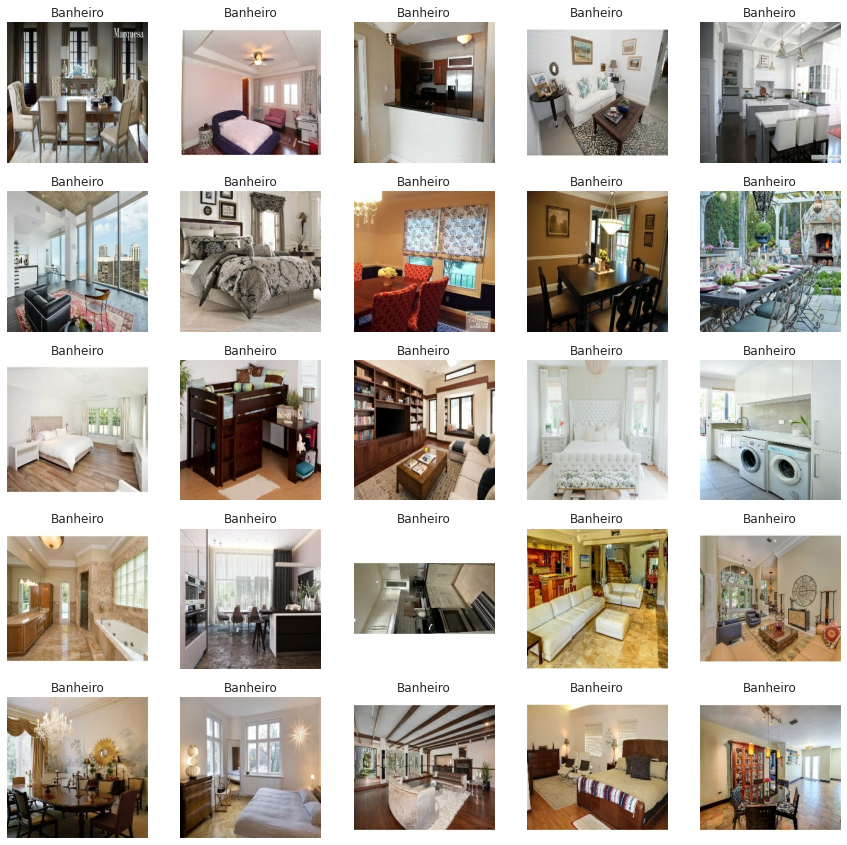

In [ ]:
plt.figure(figsize=(15, 15))

for images, labels in train_ds.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        classes = labels[i].numpy().astype("uint8")
        label = np.argmax(classes, axis=0)
        if(label == 0):
          plt.title('Banheiro')
        elif(label == 1):
          plt.title('Quarto')
        elif(label == 2):
          plt.title('Sala de jantar')
        elif(label == 3):
          plt.title('Cozinha')
        elif(label == 4):
          plt.title('Sala de estar')
        else:
          plt.title('Sem rótulo')
        plt.axis("off")

Uma camada que realiza o data augmentation. Essa camada vai ser incluida em alguns casos do treinamento para efeitos de comparação. 

In [ ]:
data_augmentation = keras.Sequential(
    [
        layers.RandomRotation(factor=0.01),
        layers.RandomTranslation(height_factor=0.1, width_factor=0.4),
    ]
)

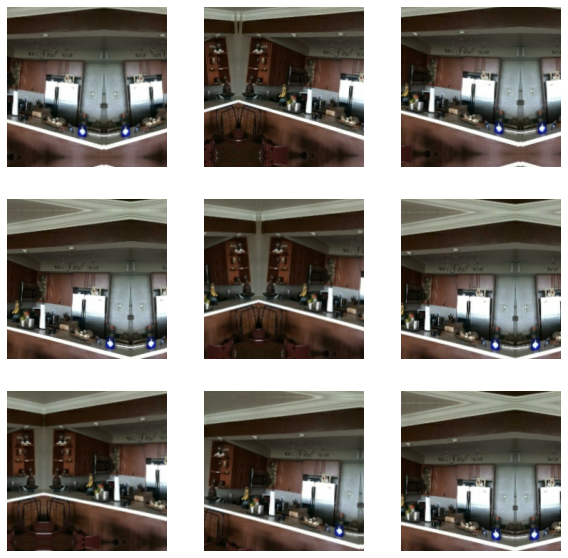

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [ ]:
train_ds = train_ds.prefetch(buffer_size=32)
val_ds = val_ds.prefetch(buffer_size=32)

# Criação dos Modelos

Aqui iremos definir as funções que criam os modelos que sertão testados.
Optou por testar a transferência de aprendizagem com o MobileNet por este rodar melhor em dispositivos mobile.

Durante a conversão para tensorflowjs notou-se que se for utilizado o data agumentation não é possível converter pro formato de grafo. Então o treinamento foi feito com e sem data augmentation para que fosse possível comparar a acurácia e desempenho de ambos.

Referência ao mobile net: https://arxiv.org/abs/1704.04861

In [ ]:
def top_model(x):
  reg = tf.keras.regularizers.l1_l2(l1=1e-3, l2=1e-3)
  x = layers.GlobalAveragePooling2D()(x)
  x = layers.Dense(32, activation='relu', kernel_regularizer=reg)(x)
  x = layers.Dropout(0.5)(x)
  return x

In [ ]:
def make_model(base_model, preprocess,  with_data_augmentation=True):

  base_model.trainable = False
  inputs = Input(shape=image_size + (3,))

  if with_data_augmentation == True:
    x = data_augmentation(inputs)
    x = preprocess(x)
  else:
    x = preprocess(inputs)

  x = base_model(x, training=False)
  x = top_model(x)
  outputs = layers.Dense(5, name='classification', activation='softmax')(x)

  model = keras.Model(inputs, outputs)
  return model

# Treinamento e comparação dos modelos

Definição das callbacks que serão utilizadas

In [ ]:
callbacks = [
            EarlyStopping(monitor = 'val_loss', patience = 10, verbose = 1, restore_best_weights=True),
]

Função que treina o modelo e função que plota as curvas de treinamento.

In [ ]:
def train_model(clf, name='model'):
  epochs = 200 
  opt = tf.keras.optimizers.SGD(learning_rate=1e-3, momentum=0.9)
  clf.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics=['accuracy'])
  clf.summary()
  history = clf.fit(train_ds, epochs=epochs, workers=8, callbacks=callbacks, validation_data=val_ds)
  clf.save('keras_model/'+name+'.h5',save_format='h5')
  return clf, history


In [ ]:
def plot_history_stats(history):
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'], '')
  plt.xlabel("Épocas'")
  plt.ylabel('Função de Perda')
  plt.title('Variacão da Função de Perda por Épocas')
  plt.legend(['Função de Perda de Treinamento', 'Função de Perda de Validação'])
  plt.show()
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'], '')
  plt.xlabel("Épocas")
  plt.ylabel('Acurácia')
  plt.title('Variação de Acurácia por Épocas')
  plt.legend(['Acurácia de Treinamento', 'Acurácia de Validação'])
  plt.show()

## Modelo 1: MobileNet

In [ ]:
%%time
base_model = MobileNet(weights='imagenet', input_shape=(224, 224, 3), include_top=False)
modelV1 = make_model(base_model, preprocess_input_v1, with_data_augmentation=False)
mobilenetV1_model, mobilenetV1_history = train_model(modelV1, 'mobilenetV1')

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 tf.math.truediv_4 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_4 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenet_1.00_224 (Functio  (None, 7, 7, 1024)       3228864   
 nal)                                                            
                                                                 
 global_average_pooling2d_4   (None, 1024)             0         
 (GlobalAveragePooling2D)                                  

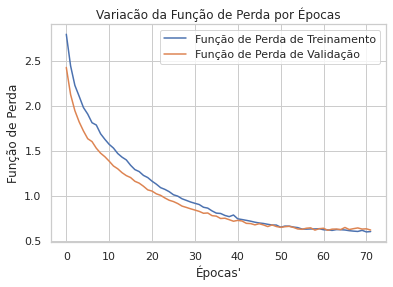

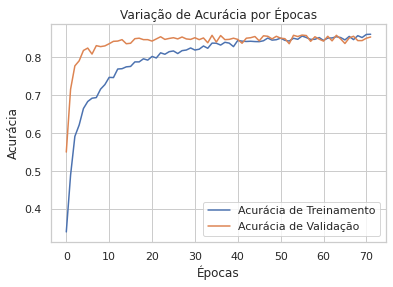

In [ ]:
plot_history_stats(mobilenetV1_history)

## Modelo 2: MobileNet (com data augmentation)

In [ ]:
%%time
base_model = MobileNet(weights='imagenet', input_shape=(224, 224, 3), include_top=False)
modelV1_da = make_model(base_model, preprocess_input_v1, with_data_augmentation=True)
mobilenetV1_da_model, mobilenetV1_da_history = train_model(modelV1_da, 'mobilenetV1_da')

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_5 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_5 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenet_1.00_224 (Functio  (None, 7, 7, 1024)       3228864   
 nal)                                                            
                                                           

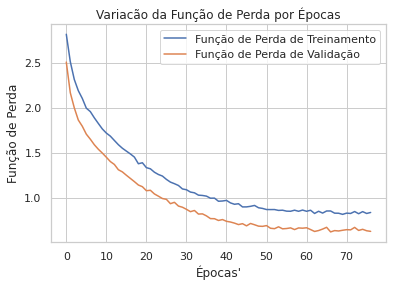

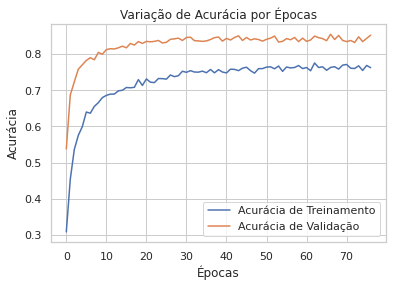

In [ ]:
plot_history_stats(mobilenetV1_da_history)

## Modelo 3: MobileNetV2

In [ ]:
%%time
base_model = MobileNetV2(weights='imagenet', input_shape=(224, 224, 3), include_top=False)
modelV2 = make_model(base_model, preprocess_input_v2, with_data_augmentation=False)
mobilenetV2_model, mobilenetV2_history = train_model(modelV2, 'mobilenetV2')

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 tf.math.truediv_6 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_6 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_6   (None, 1280)             0         
 (GlobalAveragePooling2D)                                  

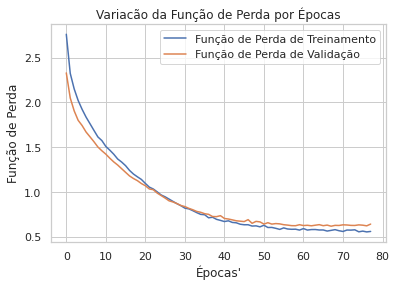

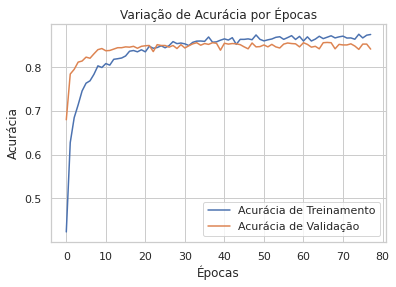

In [ ]:
plot_history_stats(mobilenetV2_history)

## Modelo 4: MobileNetV2 (com data augmentation)

---



In [ ]:
%%time
base_model = MobileNetV2(weights='imagenet', input_shape=(224, 224, 3), include_top=False)
modelV2_da = make_model(base_model, preprocess_input_v2, with_data_augmentation=True)
mobilenetV2_da_model, mobilenetV2_da_history = train_model(modelV2_da, 'mobilenetV2_da')

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_7 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_7 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                           

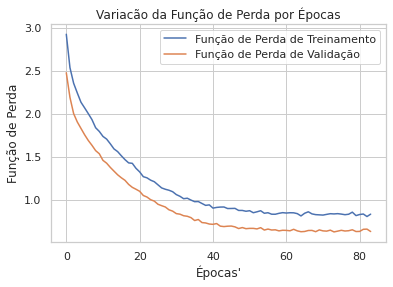

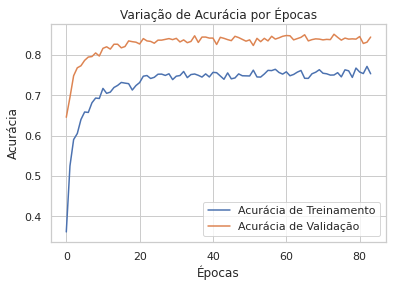

In [ ]:
plot_history_stats(mobilenetV2_da_history)

#Verificando a acurácia dos modelos

Existem 1575 dados no conjunto de validação divididos em batch de 32.
Portanto existe 50 lotes de 32 dados.

In [ ]:
score, acc = mobilenetV1_model.evaluate(val_ds, batch_size=32)
print('Test score:', score)
print('Test accuracy:', acc)

50/50 [==============================] - 2s 28ms/step - loss: 0.6166 - accuracy: 0.8559
Test score: 0.6166382431983948
Test accuracy: 0.8558729887008667


In [ ]:
score, acc = mobilenetV1_da_model.evaluate(val_ds, batch_size=32)
print('Test score:', score)
print('Test accuracy:', acc)

50/50 [==============================] - 2s 28ms/step - loss: 0.6194 - accuracy: 0.8546
Test score: 0.6194422841072083
Test accuracy: 0.8546031713485718


In [ ]:
score, acc = mobilenetV2_model.evaluate(val_ds, batch_size=32)
print('Test score:', score)
print('Test accuracy:', acc)

50/50 [==============================] - 2s 32ms/step - loss: 0.6207 - accuracy: 0.8565
Test score: 0.6207137703895569
Test accuracy: 0.8565079569816589


In [ ]:
score, acc = mobilenetV2_da_model.evaluate(val_ds, batch_size=32)
print('Test score:', score)
print('Test accuracy:', acc)

50/50 [==============================] - 2s 32ms/step - loss: 0.6283 - accuracy: 0.8514
Test score: 0.6282592415809631
Test accuracy: 0.8514285683631897


#Fine tunning

O melhor desempenho foi o do modelo MobileNet sem data augmentation. Assim, um ajuste fino será feito nesse modelo, "descongelando" as camadas do modelo base e timinuindo a taxa de aprendizagem. 

In [ ]:
model = load_model('keras_model/mobilenetV1.h5')


A camada que precisa ser setada como treinável é a camda onde se encontra o modelo MobileNet. 

In [ ]:
model.layers[3]

In [ ]:
model.layers[3].trainable = True


In [ ]:
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 tf.math.truediv_5 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_5 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenet_1.00_224 (Functio  (None, 7, 7, 1024)       3228864   
 nal)                                                            
                                                                 
 global_average_pooling2d_5   (None, 1024)             0         
 (GlobalAveragePooling2D)                                  

In [ ]:
%%time
opt = tf.keras.optimizers.SGD(learning_rate=1e-5)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
fine_history = model.fit(train_ds, epochs=200, callbacks=callbacks, workers=8, validation_data=val_ds)
model.save('finetuning.h5')


Epoch 1/200
115/115 [==============================] - 29s 227ms/step - loss: 0.7804 - accuracy: 0.7630 - val_loss: 0.6202 - val_accuracy: 0.8527
Epoch 2/200
115/115 [==============================] - 25s 221ms/step - loss: 0.7709 - accuracy: 0.7665 - val_loss: 0.6193 - val_accuracy: 0.8521
Epoch 3/200
115/115 [==============================] - 26s 221ms/step - loss: 0.7456 - accuracy: 0.7774 - val_loss: 0.6166 - val_accuracy: 0.8521
Epoch 4/200
115/115 [==============================] - 26s 223ms/step - loss: 0.7337 - accuracy: 0.7755 - val_loss: 0.6153 - val_accuracy: 0.8527
Epoch 5/200
115/115 [==============================] - 25s 221ms/step - loss: 0.7258 - accuracy: 0.7899 - val_loss: 0.6108 - val_accuracy: 0.8533
Epoch 6/200
115/115 [==============================] - 25s 221ms/step - loss: 0.7238 - accuracy: 0.7924 - val_loss: 0.6098 - val_accuracy: 0.8527
Epoch 7/200
115/115 [==============================] - 25s 220ms/step - loss: 0.7131 - accuracy: 0.7888 - val_loss: 0.6067 -

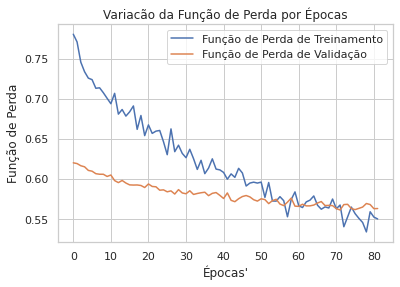

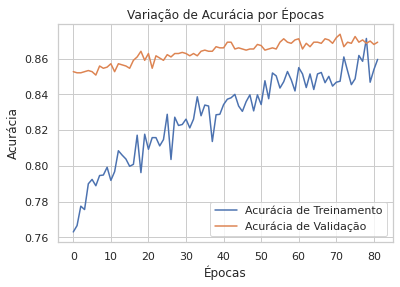

In [ ]:
plot_history_stats(fine_history)

In [ ]:
score, acc = model.evaluate(val_ds, batch_size=32)
print('Test score:', score)
print('Test accuracy:', acc)

50/50 [==============================] - 2s 37ms/step - loss: 0.5615 - accuracy: 0.8737
Test score: 0.561474621295929
Test accuracy: 0.8736507892608643


# Testes predição


In [ ]:
def do_predict(clf, path):
  img = keras.preprocessing.image.load_img(path, target_size=image_size)
  img_array = keras.preprocessing.image.img_to_array(img)
  img_array = tf.expand_dims(img_array, 0)  # Create batch axis

  predictions =clf.predict(img_array)
  category = ['Banheiro', 'Quarto', 'Sala de Jantar', 'Cozinha', 'Sala de estar']
  sns.barplot(x=np.round(predictions[0]*100, 2), y=category)


In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1l19eyDK6wyeW-Mq7HzaUj7cXSgNb_1wQ' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1l19eyDK6wyeW-Mq7HzaUj7cXSgNb_1wQ" -O Tests.zip && rm -rf /tmp/cookies.txt

--2022-03-03 17:33:59--  https://docs.google.com/uc?export=download&id=1l19eyDK6wyeW-Mq7HzaUj7cXSgNb_1wQ
Resolving docs.google.com (docs.google.com)... 74.125.203.101, 74.125.203.113, 74.125.203.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.203.101|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘STDOUT’

-                       [ <=>                ]   2.15K  --.-KB/s    in 0s      

2022-03-03 17:33:59 (50.8 MB/s) - written to stdout [2197]

--2022-03-03 17:33:59--  https://docs.google.com/uc?export=download&confirm=t&id=1l19eyDK6wyeW-Mq7HzaUj7cXSgNb_1wQ
Resolving docs.google.com (docs.google.com)... 74.125.203.113, 74.125.203.102, 74.125.203.138, ...
Connecting to docs.google.com (docs.google.com)|74.125.203.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-04-5g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/49r0kgijok2rv2cajjq4v

In [ ]:
!unzip -qqo Tests.zip

In [ ]:
from IPython.display import Image
sns.set_theme()
sns.set_color_codes("pastel")

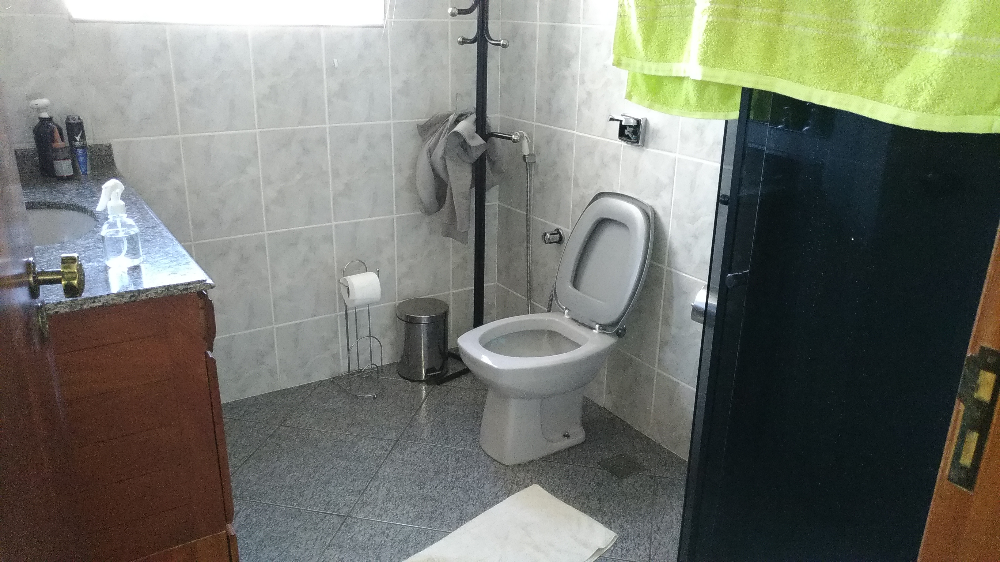

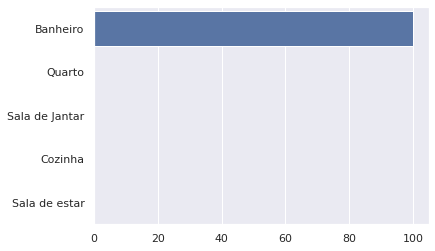

In [ ]:
path = '/content/Tests/foto01.jpeg'
do_predict(model, path)
Image(path, height=300, width=300)

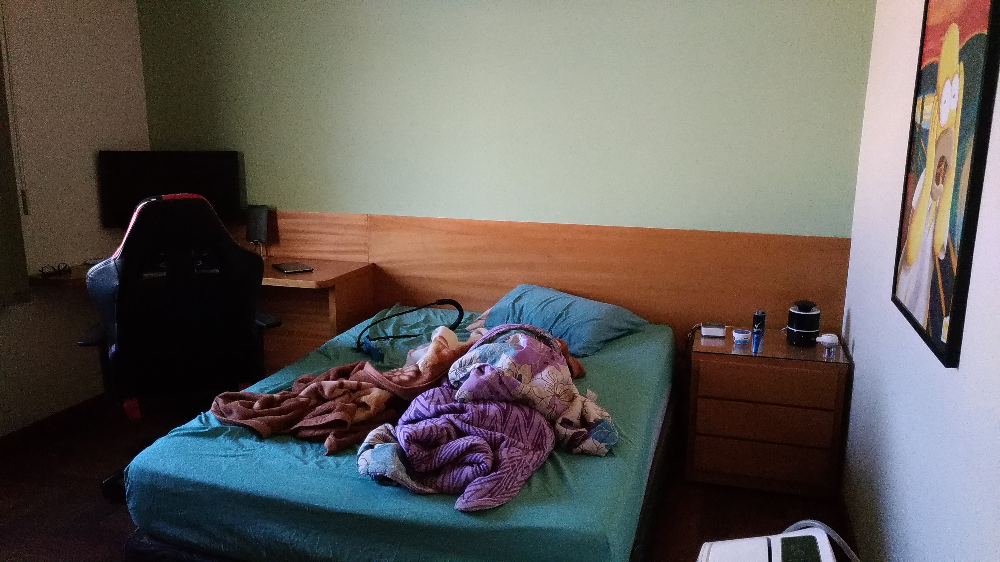

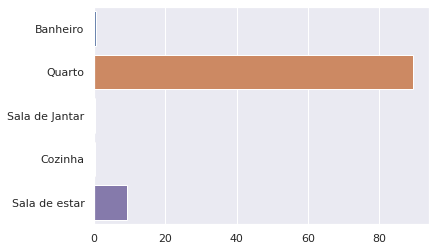

In [ ]:
path = '/content/Tests/foto02.jpeg'
do_predict(model, path)
Image(path, height=300, width=300)

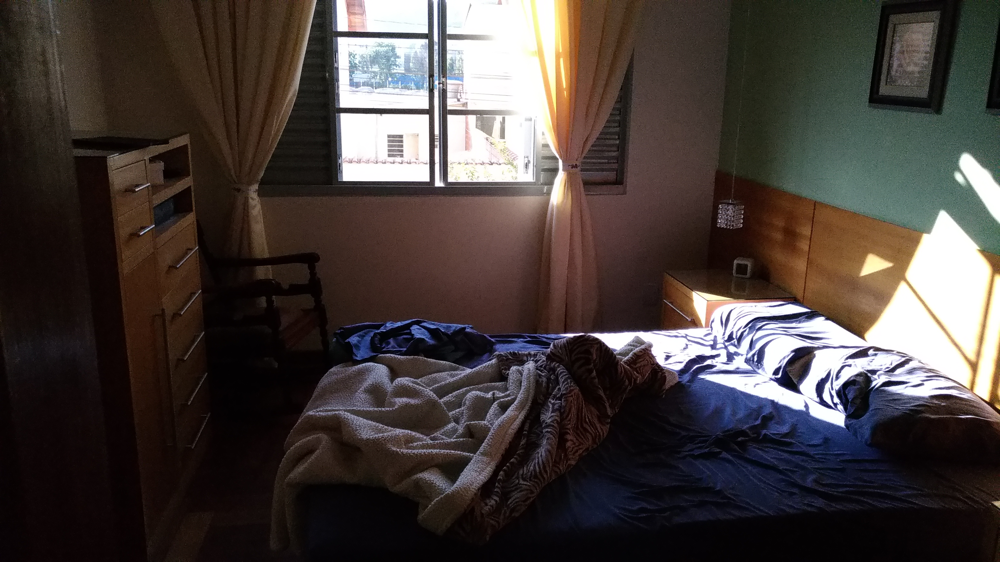

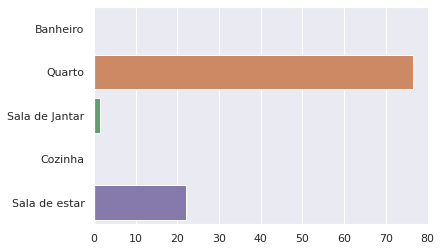

In [ ]:
path = '/content/Tests/foto03.jpeg'
do_predict(model, path)
Image(path, height=300, width=300)

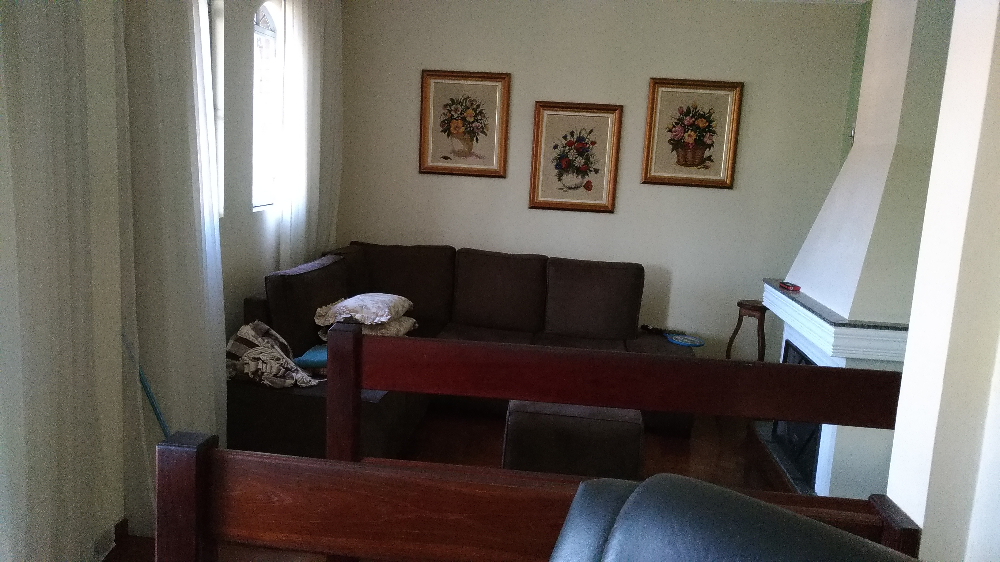

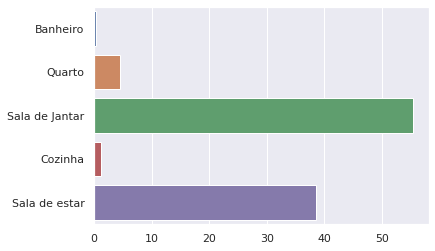

In [ ]:
path = '/content/Tests/foto04.jpeg'
do_predict(model, path)
Image(path, height=300, width=300)

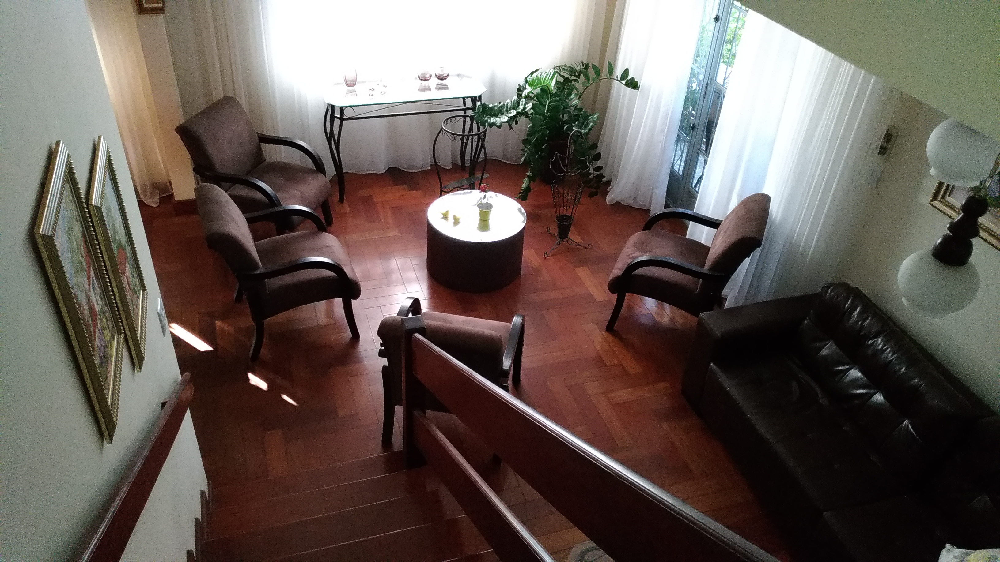

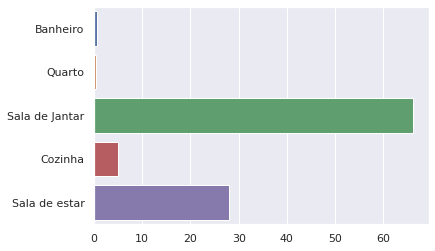

In [ ]:
path = '/content/Tests/foto05.jpeg'
do_predict(model, path)
Image(path, height=300, width=300)

# Convertendo o modelo pro formato do Tensorflow.js

In [ ]:
!pip install tensorflowjs

Convert pro formato de grafo não permite usar transferencia de aprendizagem. Ver: https://github.com/tensorflow/tfjs/tree/master/tfjs-converter#format-conversion-support-tables

In [ ]:
!tensorflowjs_converter --input_format keras --output_format tfjs_graph_model --quantize_float16 --weight_shard_size_bytes 50000000 /content/finetuning.h5 tfjs_model


In [ ]:
!zip -r tfjs_model.zip tfjs_model